In [1]:
import skimage
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import os
import random
import cv2
import math
from random import randrange
import maxflow
import time
%matplotlib inline

In [19]:
class VIBE(object):
    def __init__(self, frame, radius=10, matching_threshold=0.1, update_factor=0.01, distance_threshold=0.3):
        self.height, self.width = frame.shape[:2]
        self.samples = np.zeros((radius * 2,) + frame.shape)
        self.radius = radius
        self.update_factor = update_factor
        self.matching_threshold = matching_threshold
        self.distance_threshold = distance_threshold
        
        for i in range(self.height):
            for j in range(self.width):
                i_pos = np.clip(i, self.radius, self.height - self.radius - 1)
                j_pos = np.clip(j, self.radius, self.width - self.radius - 1)
                self.samples[0, i, j] = frame[i,j]
                for k in range(1, self.radius):
                    self.samples[k, i, j] = frame[i_pos + randrange(-self.radius, self.radius + 1),\
                                           j_pos + randrange(-self.radius, self.radius + 1)]

    def update(self, frame):
        mask = np.sum(np.abs(self.samples - frame), axis=3)
        mask = np.sum(mask < self.distance_threshold, axis=0)
        mask =  np.float32(mask < self.matching_threshold) 

        for i in range(self.height):
            for j in range(self.width):
                if mask[i, j] == 0.0:
                    if random.random() < self.update_factor:
                        self.samples[randrange(0, self.radius * 2), i, j] = frame[i, j]
                        i_pos = np.clip(i + randrange(-1, 2), 0, self.height - 1)
                        j_pos = np.clip(j + randrange(-1, 2), 0, self.width - 1)
                        self.samples[randrange(0, self.radius * 2), i_pos, j_pos] = frame[i, j]
        return mask

In [3]:
def precision_recall_f1(gt, pred):
    gt_ = (gt > 0).flatten()
    pred_ = (pred > 0).astype(np.uint32).flatten()
    tp = (gt_ * pred_).sum()
    fp = gt_.sum() - tp
    fn = pred_.sum() - tp
    pr = tp * 1. / (tp + fp)
    rec = tp * 1. / (tp + fn)
    return pr, rec, 2 * pr * rec / (pr + rec)

## Baseline

In [4]:
def str_(im, len=6):
    rank = 0
    x = im
    while x > 0:
        x /= 10
        rank += 1
    if im == 0:
        rank = 1
    s = ''
    while len - rank > 0:
        s += '0'
        len -= 1
    s += str(im)
    return s

def read_data(dirname, valid_input):
    gt_path = dirname + 'groundtruth'
    gt_images = []
    for i in range(valid_input, len(os.listdir(gt_path)) + 1):
        gt_images.append(io.imread(gt_path + '/gt' + str_(i) + '.png') / 255.)
     
    in_path = dirname + 'input'
    in_images = []
    for i in range(valid_input, len(os.listdir(in_path)) + 1):
        in_images.append(io.imread(in_path + '/in' + str_(i) + '.jpg') / 255.)
    
    return gt_images, in_images

In [15]:
%%time
baseline_highway_gt, baseline_highway_in = read_data('dataset2014/dataset/baseline/highway/', 470)
# baseline_office_gt, baseline_office_in = read_data('dataset2014/dataset/baseline/office/', 570)
# baseline_pedestrians_gt, baseline_pedestrians_in = read_data('dataset2014/dataset/baseline/pedestrians/', 300)
# baseline_pets_gt, baseline_pets_in = read_data('dataset2014/dataset/baseline/PETS2006/', 300)

CPU times: user 8.94 s, sys: 2.27 s, total: 11.2 s
Wall time: 13.4 s


In [5]:
def estimate_back(baseline_gt, baseline_in, with_mrf=False):
    precision, recall, f1 = [], [], []

    vibe = VIBE(baseline_in[0])
    for i in range(len(baseline_in)):
        if i % 100 == 0:
            print i
            pred = vibe.update(baseline_in[i])
            if with_mrf:
                pred = mrf(baseline_in[i], pred)
            metrics = precision_recall_f1(baseline_gt[i], pred)
            precision.append(metrics[0])
            recall.append(metrics[1])
            f1.append(metrics[2])
#         if i % 100 == 0:
            plt.subplot(len(baseline_in) / 100 + 1, 3, 3 * i / 100 + 1)
            io.imshow(baseline_in[i])
            plt.subplot(len(baseline_in) / 100 + 1, 3, 3 * i / 100 + 2)
            io.imshow(pred)
            plt.subplot(len(baseline_in) / 100 + 1, 3, 3 * i / 100 + 3)
            io.imshow(baseline_gt[i])
    return precision, recall, f1

CPU times: user 6min 46s, sys: 20.5 s, total: 7min 6s
Wall time: 7min 24s


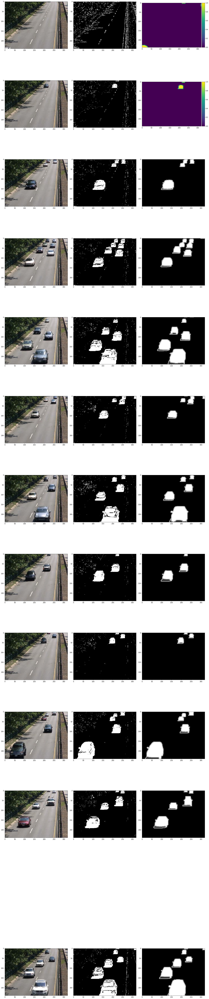

In [117]:
%%time
plt.figure(figsize=(20, 100))
estimate_back(baseline_gt, baseline_in)

## Метрики оценки качества

In [119]:
print 'precision: ', np.mean(precision)
print 'recall: ', np.mean(recall)
print 'f1: ', np.mean(f1)

precision:  0.685769275776
recall:  0.11220545733
f1:  0.188005087189


Очень плохой recall, что ожидаемо из-за стремного шума

## Метод борьбы с шумом - MRF

In [10]:
def mrf(img, mask, A=0.1, B=0.3, sigma=1):
    g = maxflow.Graph[float](np.prod(mask.shape), np.prod(mask.shape) * 4)
    nodes = g.add_nodes(np.prod(mask.shape))
    positions = [(1,0), (-1,0), (0,1), (0,-1)]
    for i in range(mask.shape[0]):
        for j in range(mask.shape[1]):
            node1 = nodes[i * mask.shape[1] + j]
            g.add_tedge(node1, -mask[i, j], -1 + mask[i, j])
            for k, l in positions:
                if 0 <= i + k < mask.shape[0] and 0 <= j + l < mask.shape[1]:
                    node2 = nodes[(i + k) * mask.shape[1] + j + l]
                    magnitude = A + B * np.exp(-np.linalg.norm(img[i, j] - img[i + k, j + l]) ** 2 / 2 * sigma ** 2)
                    g.add_edge(node1, node2, magnitude / 2, magnitude / 2)
    flow = g.maxflow()
    res = np.zeros(mask.shape, np.int)
    for i in range(res.shape[0]):
        for j in range(res.shape[1]):
            res[i,j] = g.get_segment(nodes[i * res.shape[1] + j])
    return res

In [20]:
vibe = VIBE(baseline_highway_in[0])
pred = vibe.update(baseline_highway_in[100])
# pred = mrf(baseline_highway_in[100], pred)

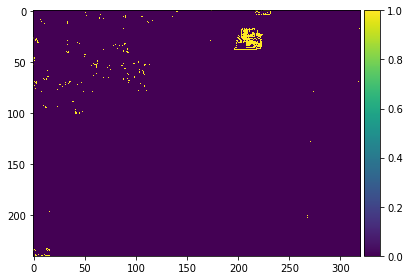

In [240]:
io.imshow(pred)

In [241]:
m = mrf(baseline_highway_in[100], pred, sigma=1)

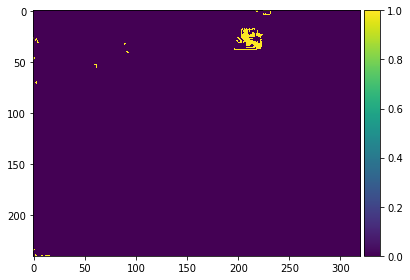

In [242]:
io.imshow(m)

In [244]:
dynamic_gt, dynamic_in = read_data('dataset2014/dataset/dynamicBackground/fountain02/', 500)

In [251]:
len(dynamic_gt)

1000

0


/Users/spotapova/env/lib/python2.7/site-packages/ipykernel/__main__.py:8: RuntimeWarning: invalid value encountered in double_scalars
/Users/spotapova/env/lib/python2.7/site-packages/ipykernel/__main__.py:9: RuntimeWarning: invalid value encountered in double_scalars


100
200
300
400
500
600
700
800
900
CPU times: user 1min 1s, sys: 1.11 s, total: 1min 2s
Wall time: 1min 3s


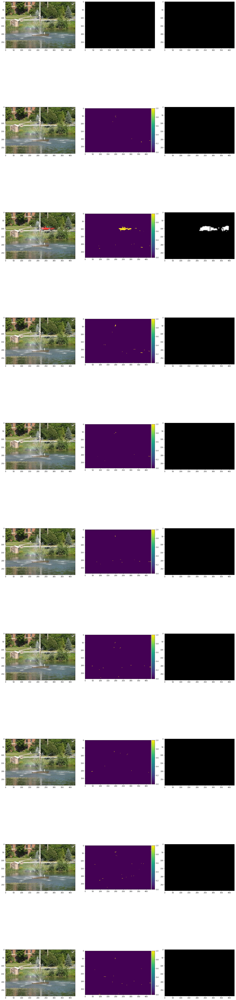

In [252]:
%%time
plt.figure(figsize=(20, 100))
estimate_back(dynamic_gt, dynamic_in, with_mrf=True)

In [253]:
print 'precision: ', np.mean(precision)
print 'recall: ', np.mean(recall)
print 'f1: ', np.mean(f1)

precision:  0.685769275776
recall:  0.11220545733
f1:  0.188005087189


## NightVideos, BadWeather

In [ ]:
night_gt, night_in = read_data('dataset2014/dataset/nightVideos/tramStation/', 500)

In [255]:
len(night_gt)

2501

0


/Users/spotapova/env/lib/python2.7/site-packages/ipykernel/__main__.py:9: RuntimeWarning: invalid value encountered in double_scalars


100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
CPU times: user 4min 4s, sys: 5.78 s, total: 4min 10s
Wall time: 4min 36s


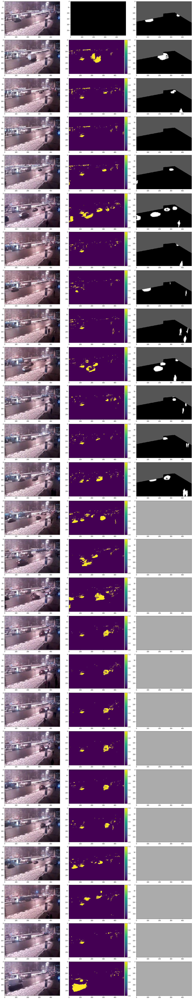

In [256]:
%%time
plt.figure(figsize=(20, 100))
estimate_back(night_gt, night_in, with_mrf=True)

In [6]:
weather_gt, weather_in = read_data('dataset2014/dataset/badWeather/skating/', 800)                 

In [8]:
len(weather_gt)

3101

0


/Users/spotapova/env/lib/python2.7/site-packages/ipykernel/__main__.py:8: RuntimeWarning: invalid value encountered in double_scalars


100


/Users/spotapova/env/lib/python2.7/site-packages/skimage/io/_plugins/matplotlib_plugin.py:74: UserWarning: Low image dynamic range; displaying image with stretched contrast.
  warn("Low image dynamic range; displaying image with "


200
300


/Users/spotapova/env/lib/python2.7/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in double_scalars


400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
CPU times: user 5min 19s, sys: 4.9 s, total: 5min 24s
Wall time: 5min 29s


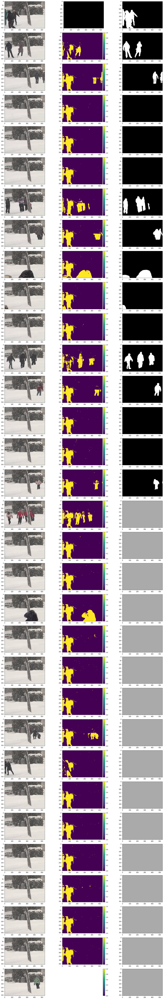

In [11]:
%%time
plt.figure(figsize=(20, 100))
estimate_back(weather_gt, weather_in, with_mrf=True)

Как и следовало ожидать, для плохого освещения и плохой погоды плохо работает( но в целом алгоритм визуально показывает неплохие результаты